---
title: Analysis of GSE104323 - single cells from the developing mouse dentate gyrus.
authors:
- shashank.jatav@elucidata.io
tags:
- singlecell
- dentategyrus
created_at: 2019-07-12
updated_at: 2019-07-12
tldr: This is an analysis of the GSE104323 dataset using Seurat.
---

In [1]:
library(Seurat)
library(dplyr)
library(Matrix)
packageVersion("Seurat")
library(data.table)
# set plot widths for the notebook
library(repr)
options(repr.plot.width=13, repr.plot.height=9)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




[1] ‘3.1.4’


Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last




## Getting data from source

In [2]:
system("wget ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE104nnn/GSE104323/suppl/GSE104323_10X_expression_data_V2.tab.gz")
system("gunzip GSE104323_10X_expression_data_V2.tab.gz", intern = TRUE)

character(0)

## Reading in the Data

In [3]:
DataMatrix <- fread("GSE104323_10X_expression_data_V2.tab")
DataMatrix <- as.data.frame(DataMatrix)
row.names(DataMatrix) <- DataMatrix$cellid
DataMatrix$cellid <- NULL

In [4]:
head(DataMatrix)
dim(DataMatrix)

,10X79_1_TCTACCATGCCTAA-,10X79_2_GTACTAGTGAACAT-,10X79_2_AATCAGTACCTACA-,10X79_1_CGGGTTCTTGAGGT-,10X79_1_GTGGAAGGCGTACA-,10X79_1_GTCCGCAAGCCATT-,10X79_2_TAAAGCAATACGCT-,10X79_1_AGTGATCAGCAACT-,10X79_1_CTCAATCCCAAGAT-,10X79_1_CCTTGTCGGATGTT-,⋯,10X79_2_CCAAATCCTCCTAG-,10X79_2_ATGTAGTTATCGGT-,10X80_2_GCTAATCTTATCTG-,10X80_1_CATTTAGTACGCGA-,10X80_2_GAATCTCAGCGACC-,10X80_1_CACGGTCTACGAGT-,10X80_2_ATTGCAGCCACGTC-,10X80_1_GCGGTTCGGCATCG-,10X83_4_TTCAGCATACTCTT-,10X80_1_TTACCAGGAGTAGA-
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
0610007P14Rik,0,0,1,0,0,0,0,1,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009B22Rik,0,0,1,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009L18Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009O20Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,1,0,0,0,0
0610010F05Rik,0,0,0,0,0,0,0,1,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610010K14Rik,0,0,0,0,0,1,0,1,0,0,⋯,0,0,0,0,0,0,0,1,0,0


[1] 27933 24185

## Creating Seurat Object

In [5]:
DentateGyrus <- CreateSeuratObject(counts = DataMatrix, min.cells = 3, project = "Dentate_3")

In [7]:
library(BiocParallel)
register(MulticoreParam(4))

## QC and selecting cells for further analysis

In [8]:
DentateGyrus[["percent.mt"]] <- PercentageFeatureSet(DentateGyrus, pattern = "^mt-")

In [9]:
head(DentateGyrus@meta.data, 5)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt
,<fct>,<dbl>,<int>,<dbl>
10X79_1_TCTACCATGCCTAA-,10X79,2285,1199,5.645514
10X79_2_GTACTAGTGAACAT-,10X79,1847,1128,12.560910
10X79_2_AATCAGTACCTACA-,10X79,2216,1202,13.357401
10X79_1_CGGGTTCTTGAGGT-,10X79,1455,999,5.223368
10X79_1_GTGGAAGGCGTACA-,10X79,1553,943,4.958146


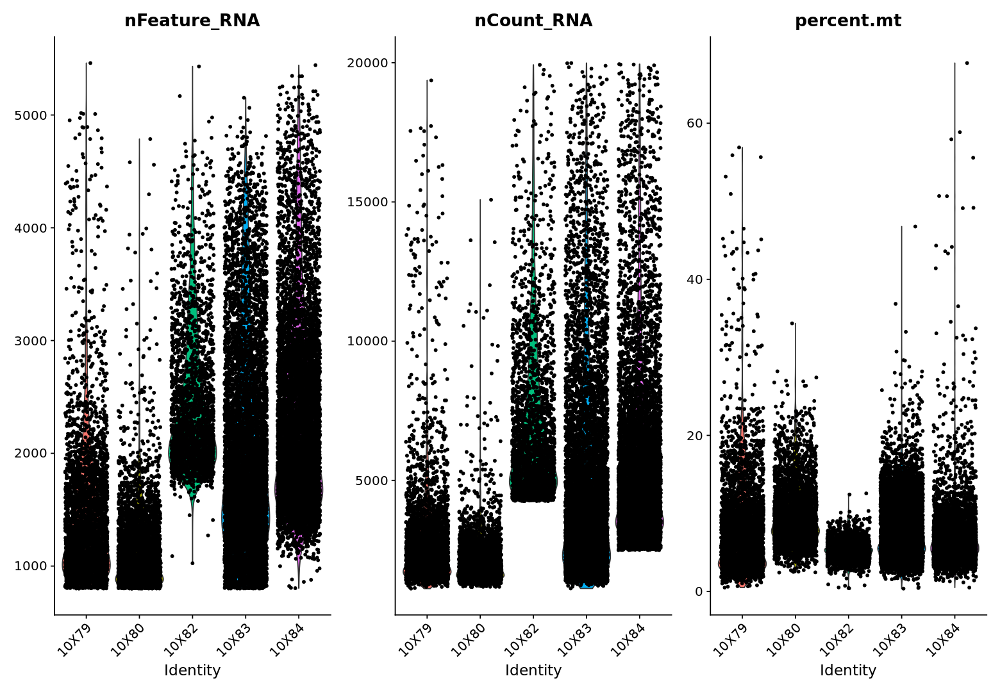

In [10]:
VlnPlot(DentateGyrus, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”


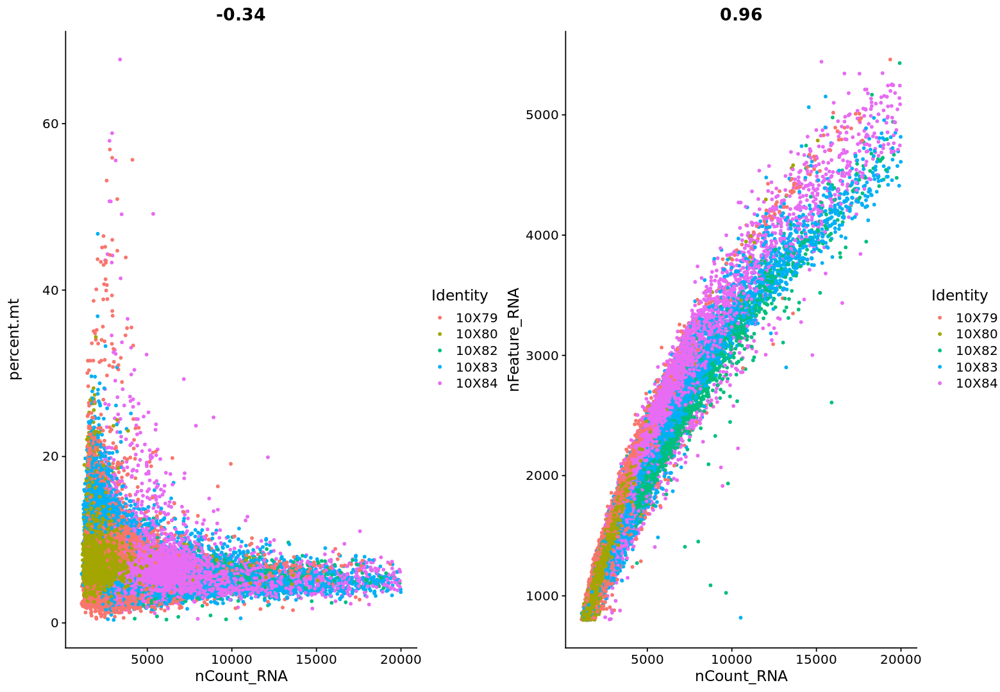

In [11]:
# FeatureScatter is typically used to visualize feature-feature relationships, but can be used
# for anything calculated by the object, i.e. columns in object metadata, PC scores etc.

plot1 <- FeatureScatter(DentateGyrus, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(DentateGyrus, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
CombinePlots(plots = list(plot1, plot2))

In [12]:
DentateGyrus <- subset(DentateGyrus, subset = nFeature_RNA > 100 & percent.mt < 20)

## Normalize the Data

In [13]:
DentateGyrus <- NormalizeData(DentateGyrus, normalization.method = "LogNormalize",
                              scale.factor = 10000)

## Identify highly variable genes

In [14]:
DentateGyrus <- FindVariableFeatures(DentateGyrus, selection.method = "vst", nfeatures = 7000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(DentateGyrus), 10)

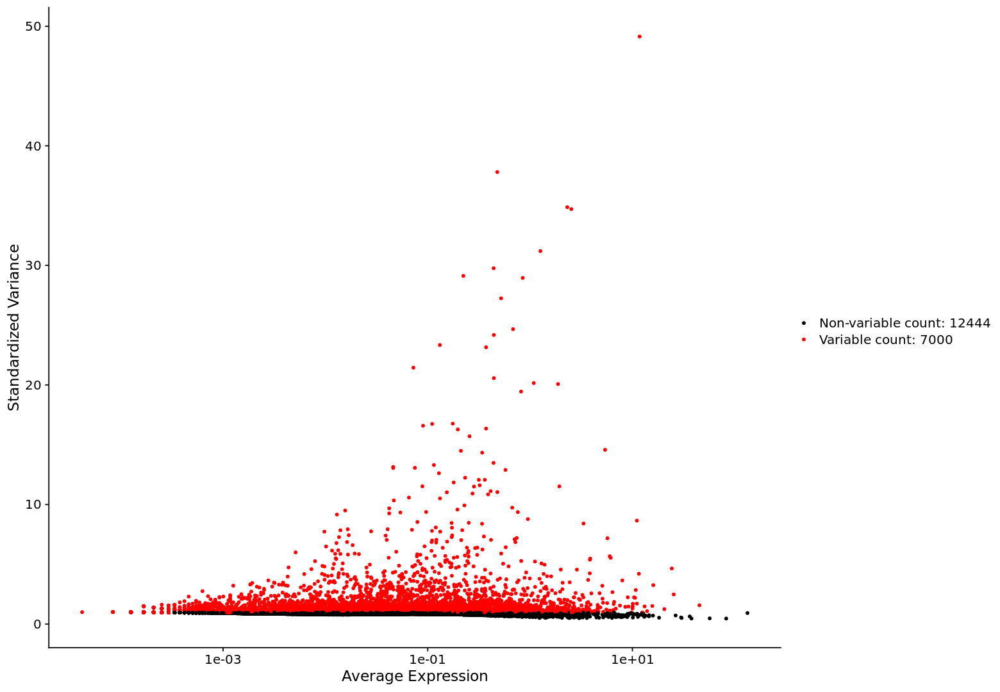

In [15]:
# plot variable features with and without labels
plot1 <- VariableFeaturePlot(DentateGyrus)
plot1

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”
When using repel, set xnudge and ynudge to 0 for optimal results



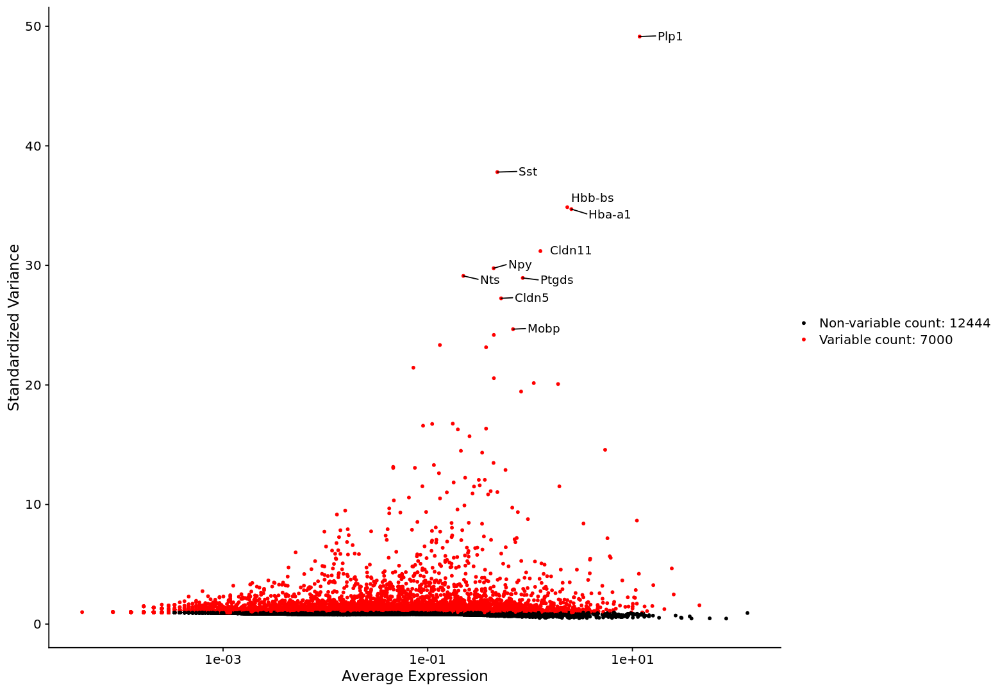

In [16]:
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot2

## Scaling the data

In [17]:
all.genes <- rownames(DentateGyrus)
DentateGyrus <- ScaleData(DentateGyrus, features = all.genes)

Centering and scaling data matrix



## PCA

In [18]:
DentateGyrus <- RunPCA(DentateGyrus, features = VariableFeatures(object = DentateGyrus))

PC_ 1 
Positive:  Ptn, Slc1a3, Apoe, Dbi, Gng5, Atp1a2, Plpp3, Qk, Cst3, Glul 
	   Tsc22d4, Mfge8, Aldoc, Cd81, Ndrg2, Ptprz1, Mt2, Gja1, Sox9, Bcan 
	   Fabp7, S100a16, Sepp1, S1pr1, Zfp36l1, Prdx6, Id3, Gnai2, Mlc1, Serpine2 
Negative:  Snca, Calm2, Snap25, Olfm1, Ppp3ca, Plppr4, Camk2b, Grin2b, Meg3, Ndrg4 
	   Snrpn, Sncb, Cplx2, Celf4, Nrgn, Cnih2, Atp1a3, Ncdn, Prkce, Syt1 
	   Atp2b1, Gria1, Pcp4, Pgm2l1, Atp1b1, Map1b, Mllt11, Ppp3r1, Ywhah, Nsf 
PC_ 2 
Positive:  Stmn1, Tmsb10, Tubb5, Tuba1a, Cd24a, Hn1, Marcksl1, Tubb2b, Tubb3, Sox11 
	   Dpysl3, Stmn2, Ybx1, Igfbpl1, Serf1, Gm1673, Nnat, Pafah1b3, Gap43, Prdx2 
	   Actg1, Dcx, Hnrnpa1, Fxyd6, Ptma, Sox4, Hint1, Eef1a1, Ddah2, Rac3 
Negative:  Mt3, Mt1, Camk2n1, Camk2a, Gpm6a, Ncdn, Ddn, Chchd10, Ptk2b, Sparcl1 
	   Fth1, Tspan7, C1ql3, Adcy1, Mkl2, Chn1, Syne1, Itm2c, Cadm2, Nsf 
	   Slc1a2, Slc17a7, Slc4a4, Nptx1, Btbd3, Ahcyl2, 2010300C02Rik, Ndrg4, Atp1b2, Wipf3 
PC_ 3 
Positive:  Aldoc, Slc1a2, Plpp3, Clu, Slc1a3, Ttyh1,

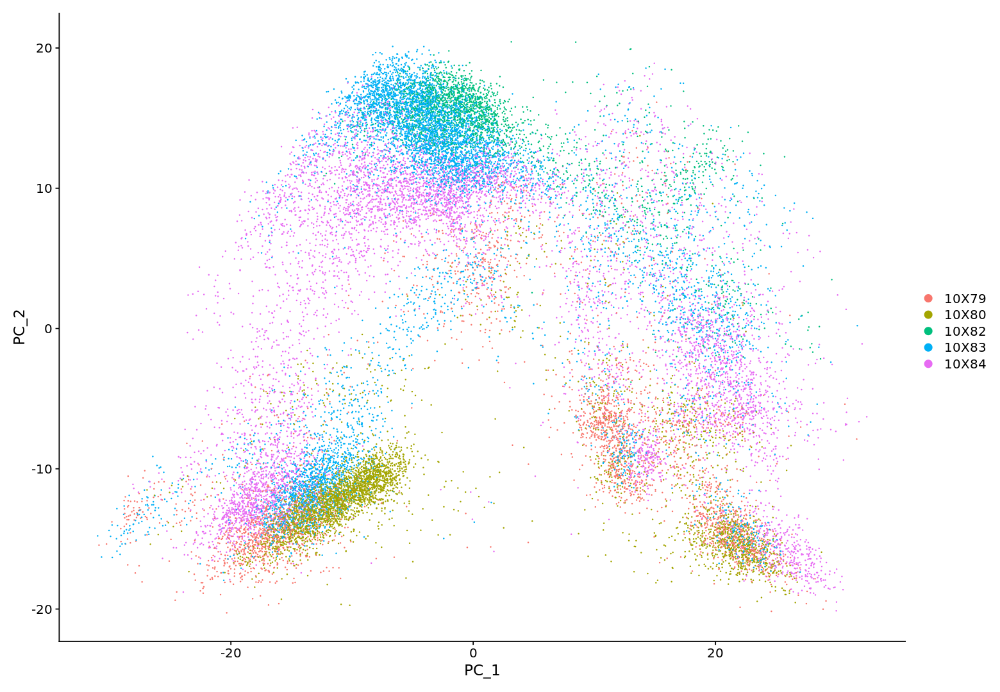

In [19]:
DimPlot(DentateGyrus, reduction = "pca")

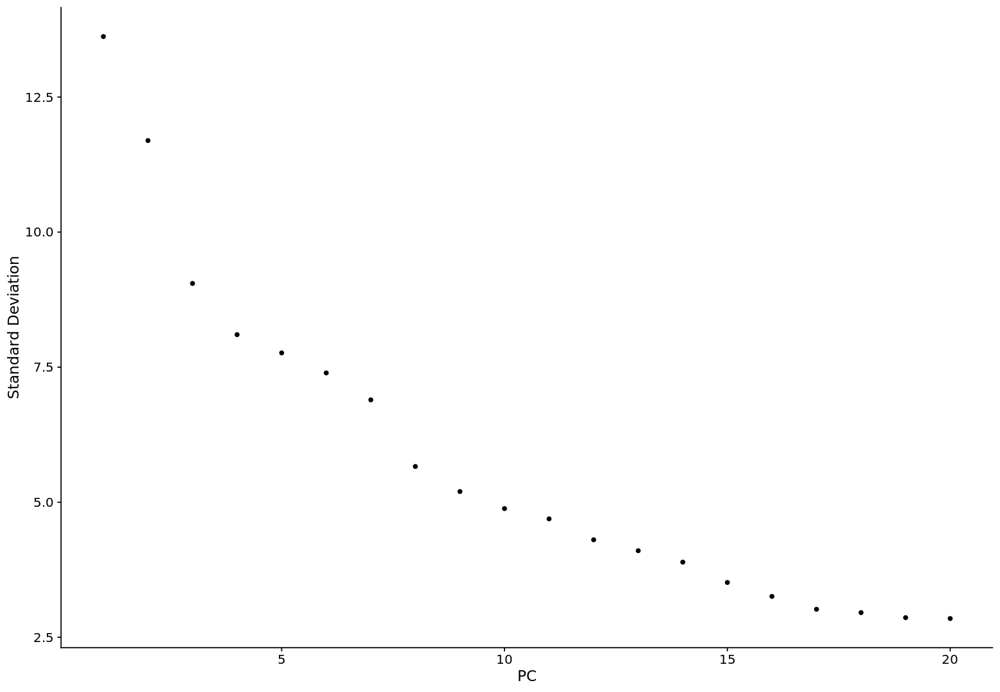

In [20]:
ElbowPlot(DentateGyrus)

## Cluster the cells

In [21]:
DentateGyrus <- FindNeighbors(DentateGyrus, dims = 1:18)
DentateGyrus <- FindClusters(DentateGyrus, resolution = 1.2)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 23831
Number of edges: 832859

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9110
Number of communities: 36
Elapsed time: 2 seconds


In [22]:
head(Idents(DentateGyrus), 5)

10X79_1_TCTACCATGCCTAA- 10X79_2_GTACTAGTGAACAT- 10X79_2_AATCAGTACCTACA- 
                     25                       9                       9 
10X79_1_CGGGTTCTTGAGGT- 10X79_1_GTGGAAGGCGTACA- 
                     25                      25 
36 Levels: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 ... 35

## tSNE plot

In [23]:
DentateGyrus <- RunTSNE(DentateGyrus, dims = 1:18)

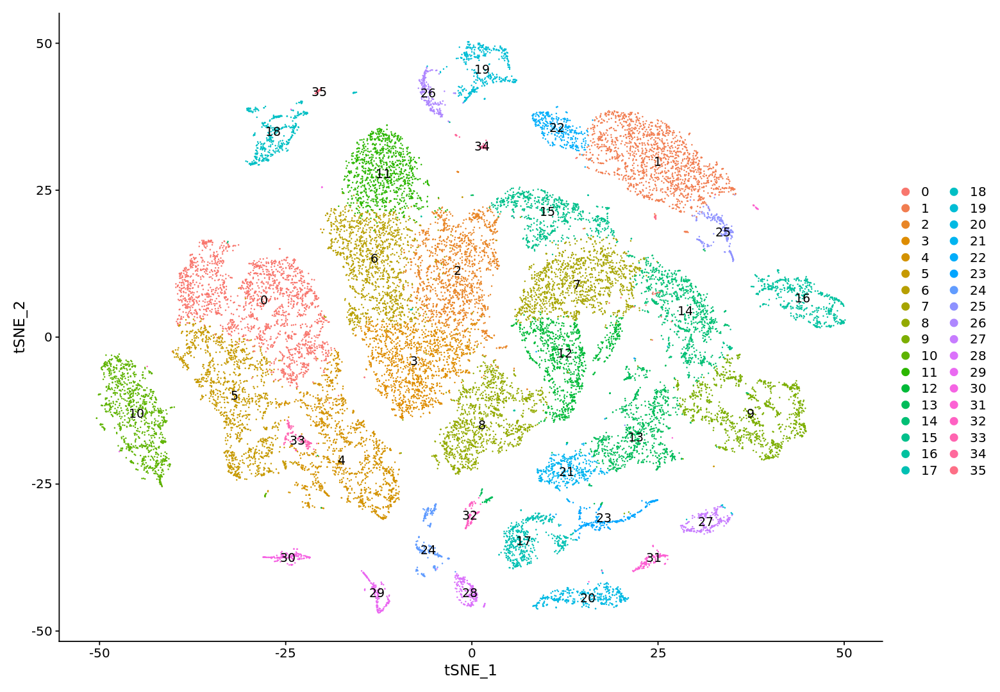

In [24]:
DimPlot(DentateGyrus, reduction = "tsne", label = T)

## Plotting Markers

### Radial Glia

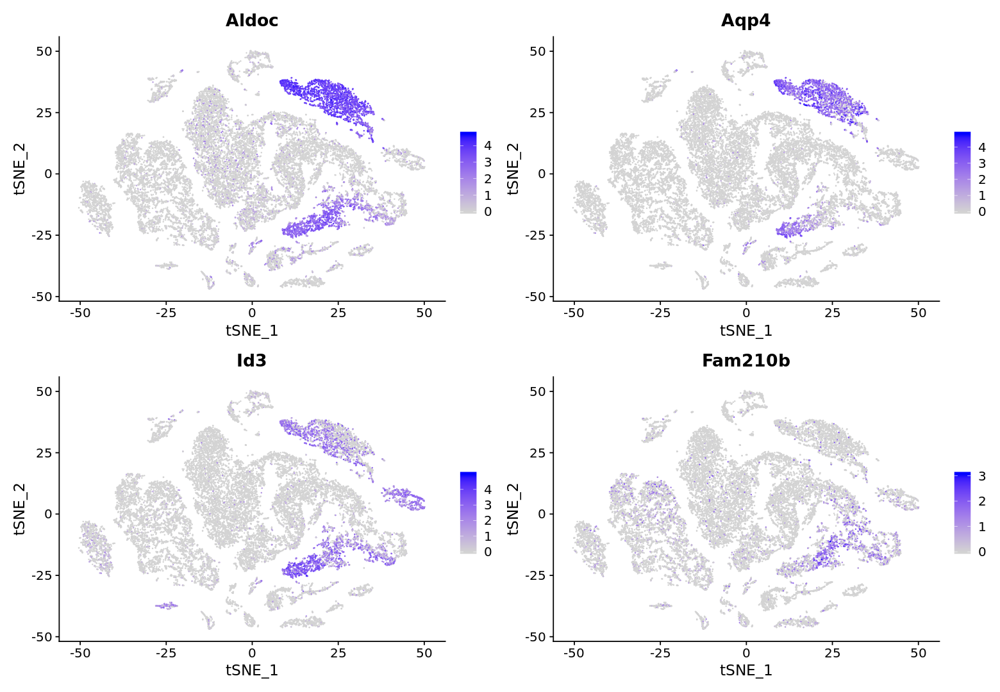

In [25]:
FeaturePlot(DentateGyrus, features = c("Aldoc", "Aqp4", "Id3", "Fam210b"))

### nIPC markers

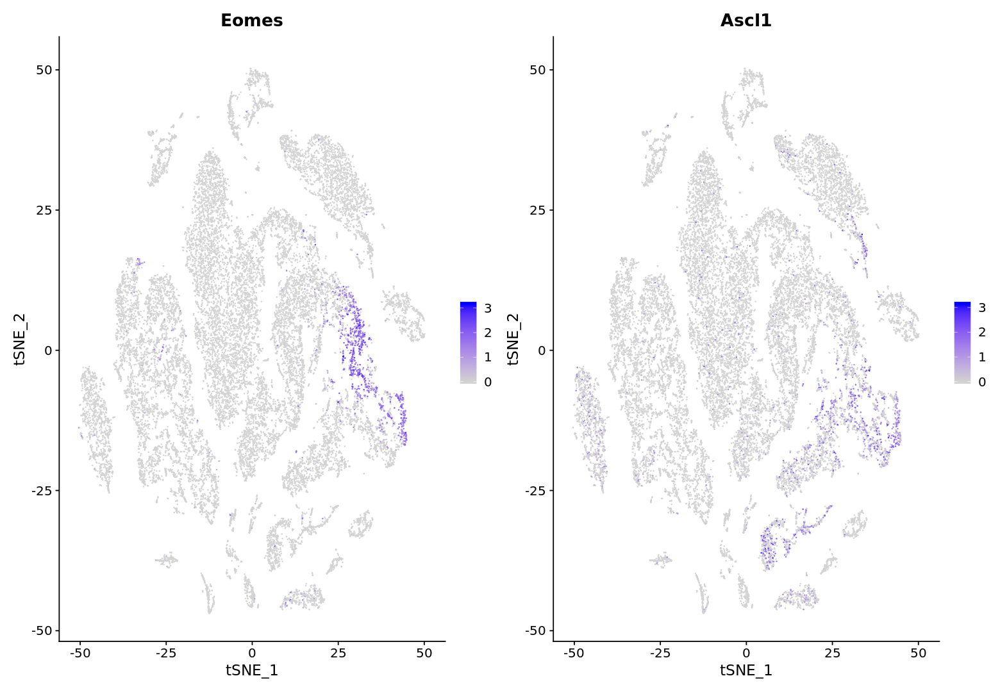

In [26]:
FeaturePlot(DentateGyrus, features = c("Eomes", "Ascl1"))

### Neuroblast 1 markers

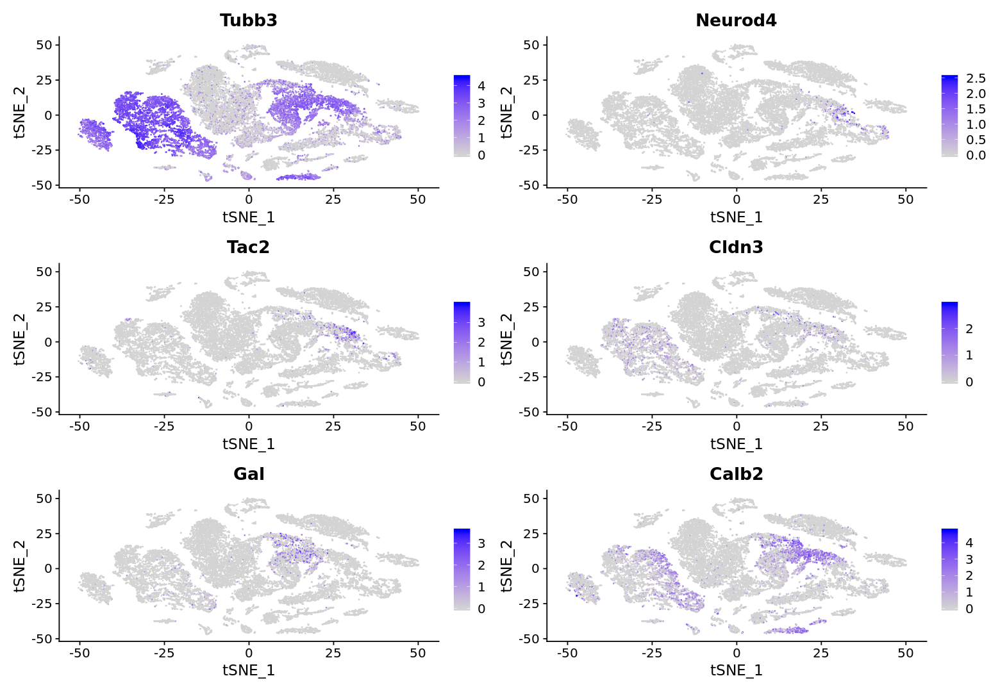

In [27]:
FeaturePlot(DentateGyrus, features = c("Tubb3", "Neurod4","Tac2","Cldn3","Gal","Calb2"))

### Neuroblast 2 markers

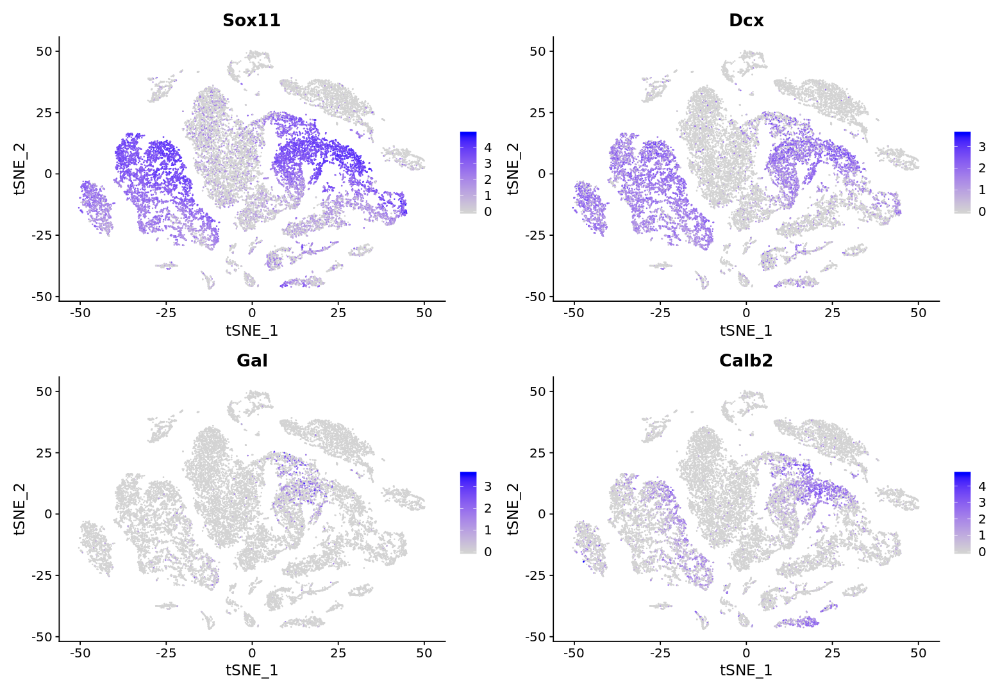

In [28]:
FeaturePlot(DentateGyrus, features = c("Sox11","Dcx","Gal","Calb2"))

## Getting metadata from source

In [31]:
system("wget ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE104nnn/GSE104323/suppl/GSE104323_metadata_barcodes_24185cells.txt.gz")
system("gunzip GSE104323_metadata_barcodes_24185cells.txt.gz", intern = TRUE)

character(0)

## Combining source and current metadata

In [32]:
Metadata <- fread("GSE104323_metadata_barcodes_24185cells.txt")
Metadata <- as.data.frame(Metadata)
head(Metadata)

,Sample name (24185 single cells),source name,organism,characteristics: strain,characteristics: age,characteristics: sex of pooled animals,characteristics: cell cluster,molecule,SRR run accession,raw file (original file name),UMI_CellularBarcode
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,10X79_1_AAACTAGCTAGCCC-,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,Neuroblast,total RNA,SRR6089817,10X79_1_AAACTAGCTAGCCC.fq.gz,CGGCGATCCC_AAACTAGCTAGCCC
2,10X79_1_AAACTAGGATGTAT-,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,OPC,total RNA,SRR6089947,10X79_1_AAACTAGGATGTAT.fq.gz,AGTGGTAATG_AAACTAGGATGTAT
3,10X79_1_AAACTCACGGCGTT-,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,GC-adult,total RNA,SRR6089529,10X79_1_AAACTCACGGCGTT.fq.gz,GGGTGCGCTC_AAACTCACGGCGTT
4,10X79_1_AAACTGTCGGCTCA-,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,MOL,total RNA,SRR6089595,10X79_1_AAACTGTCGGCTCA.fq.gz,CCTTTCAACG_AAACTGTCGGCTCA
5,10X79_1_AAACTGTGATAAGT-,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,OPC,total RNA,SRR6090058,10X79_1_AAACTGTGATAAGT.fq.gz,CCTTTCAGGT_AAACTGTGATAAGT
6,10X79_1_AAAGAAGCATGGCA-,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,RGL,total RNA,SRR6090347,10X79_1_AAAGAAGCATGGCA.fq.gz,AGTCACCGCG_AAAGAAGCATGGCA


In [33]:
head(DentateGyrus@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.1.2,seurat_clusters
,<fct>,<dbl>,<int>,<dbl>,<fct>,<fct>
10X79_1_TCTACCATGCCTAA-,10X79,2285,1199,5.645514,25,25
10X79_2_GTACTAGTGAACAT-,10X79,1847,1128,12.560910,9,9
10X79_2_AATCAGTACCTACA-,10X79,2216,1202,13.357401,9,9
10X79_1_CGGGTTCTTGAGGT-,10X79,1455,999,5.223368,25,25
10X79_1_GTGGAAGGCGTACA-,10X79,1553,943,4.958146,25,25
10X79_1_GTCCGCAAGCCATT-,10X79,2568,1534,5.724299,25,25


In [34]:
MergedMetadata <- merge.data.frame(DentateGyrus@meta.data, Metadata, by.x = "row.names",
                                   by.y = "Sample name (24185 single cells)", all.x = T)
row.names(MergedMetadata) <- MergedMetadata$Row.names
MergedMetadata$Row.names <- NULL
head(MergedMetadata)
dim(MergedMetadata)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.1.2,seurat_clusters,source name,organism,characteristics: strain,characteristics: age,characteristics: sex of pooled animals,characteristics: cell cluster,molecule,SRR run accession,raw file (original file name),UMI_CellularBarcode
,<fct>,<dbl>,<int>,<dbl>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
10X79_1_AAACTAGCTAGCCC-,10X79,5888,2533,2.275815,14,14,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,Neuroblast,total RNA,SRR6089817,10X79_1_AAACTAGCTAGCCC.fq.gz,CGGCGATCCC_AAACTAGCTAGCCC
10X79_1_AAACTAGGATGTAT-,10X79,1567,1045,2.233567,17,17,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,OPC,total RNA,SRR6089947,10X79_1_AAACTAGGATGTAT.fq.gz,AGTGGTAATG_AAACTAGGATGTAT
10X79_1_AAACTCACGGCGTT-,10X79,2114,1218,1.844844,6,6,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,GC-adult,total RNA,SRR6089529,10X79_1_AAACTCACGGCGTT.fq.gz,GGGTGCGCTC_AAACTCACGGCGTT
10X79_1_AAACTGTCGGCTCA-,10X79,2011,1006,6.016907,26,26,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,MOL,total RNA,SRR6089595,10X79_1_AAACTGTCGGCTCA.fq.gz,CCTTTCAACG_AAACTGTCGGCTCA
10X79_1_AAACTGTGATAAGT-,10X79,2533,1588,3.513620,17,17,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,OPC,total RNA,SRR6090058,10X79_1_AAACTGTGATAAGT.fq.gz,CCTTTCAGGT_AAACTGTGATAAGT
10X79_1_AAAGAAGCATGGCA-,10X79,1745,1018,6.590258,25,25,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,RGL,total RNA,SRR6090347,10X79_1_AAAGAAGCATGGCA.fq.gz,AGTCACCGCG_AAAGAAGCATGGCA


[1] 23831    16

In [38]:
OriginalMetadata <- DentateGyrus@meta.data

In [39]:
OriginalMetadata[which(row.names(OriginalMetadata) == "10X79_1_AAACTAGCTAGCCC-"),]

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.1.2,seurat_clusters
,<fct>,<dbl>,<int>,<dbl>,<fct>,<fct>
10X79_1_AAACTAGCTAGCCC-,10X79,5888,2533,2.275815,14,14


In [40]:
MergedMetadata <- MergedMetadata[match(row.names(OriginalMetadata), 
                                       row.names(MergedMetadata)
                                       ),]
head(MergedMetadata)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.1.2,seurat_clusters,source name,organism,characteristics: strain,characteristics: age,characteristics: sex of pooled animals,characteristics: cell cluster,molecule,SRR run accession,raw file (original file name),UMI_CellularBarcode
,<fct>,<dbl>,<int>,<dbl>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
10X79_1_TCTACCATGCCTAA-,10X79,2285,1199,5.645514,25,25,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,RGL,total RNA,SRR6090459,10X79_1_TCTACCATGCCTAA.fq.gz,TATGTCCCAG_TCTACCATGCCTAA
10X79_2_GTACTAGTGAACAT-,10X79,1847,1128,12.560910,9,9,dentate gyrus,Mus musculus,C57Bl/6,P19,female,RGL,total RNA,SRR6099081,10X79_2_GTACTAGTGAACAT.fq.gz,CAGCTATTGG_GTACTAGTGAACAT
10X79_2_AATCAGTACCTACA-,10X79,2216,1202,13.357401,9,9,dentate gyrus,Mus musculus,C57Bl/6,P19,female,RGL,total RNA,SRR6099074,10X79_2_AATCAGTACCTACA.fq.gz,TTTAGCCTAT_AATCAGTACCTACA
10X79_1_CGGGTTCTTGAGGT-,10X79,1455,999,5.223368,25,25,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,RGL,total RNA,SRR6090410,10X79_1_CGGGTTCTTGAGGT.fq.gz,CGTGAAGCGT_CGGGTTCTTGAGGT
10X79_1_GTGGAAGGCGTACA-,10X79,1553,943,4.958146,25,25,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,RGL,total RNA,SRR6090448,10X79_1_GTGGAAGGCGTACA.fq.gz,GGAGCCCGAC_GTGGAAGGCGTACA
10X79_1_GTCCGCAAGCCATT-,10X79,2568,1534,5.724299,25,25,dentate gyrus,Mus musculus,hGFAP-GFP,P120,2males+1female,RGL,total RNA,SRR6090444,10X79_1_GTCCGCAAGCCATT.fq.gz,ACAACCAGTC_GTCCGCAAGCCATT


In [41]:
identical(row.names(MergedMetadata), row.names(OriginalMetadata))

[1] TRUE

In [42]:
DentateGyrus@meta.data <- MergedMetadata

In [43]:
table(MergedMetadata$`characteristics: cell cluster`)


         Astro-adult            Astro-juv              CA3-Pyr 
                1158                  709                  476 
       Cajal-Retzius          Endothelial            Ependymal 
                 535                  542                  181 
                GABA             GC-adult               GC-juv 
                 193                 2605                 3368 
      Immature-Astro        Immature-GABA          Immature-GC 
                 650                 1022                 2412 
        Immature-Pyr MiCajal-Retziusoglia                  MOL 
                4518                  420                  704 
          Neuroblast                 NFOL                 nIPC 
                1380                  232                  353 
          nIPC-perin                  OPC                  PVM 
                 468                  790                   78 
                 RGL            RGL_young                 VLMC 
                 191                  6

In [44]:
DentateGyrus <- SetIdent(DentateGyrus, value = "characteristics: cell cluster")

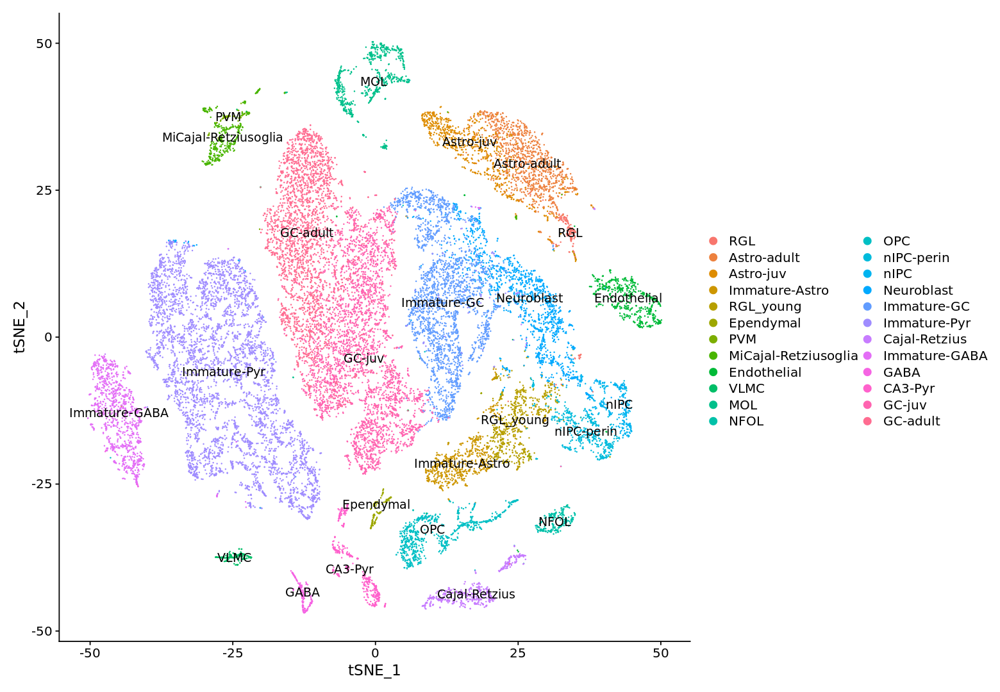

In [45]:
DimPlot(DentateGyrus, reduction = "tsne", label = T)

## Finding Differential Expression between Radial Glial cells and Neuroblasts for CombiT

In [46]:
RGLvsNeuroblast <- FindMarkers(DentateGyrus, ident.1 = "RGL_young", ident.2 = "Neuroblast", 
                               min.pct = 0.02, logfc.threshold = 0.08)
dim(RGLvsNeuroblast)
head(RGLvsNeuroblast)

[1] 4789    5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Ptn,0.000000e+00,2.732575,0.984,0.230,0.000000e+00
Aldoc,5.379993e-296,2.367637,0.860,0.076,1.046086e-291
Dbi,1.731634e-292,2.467110,1.000,0.551,3.366989e-288
Fabp7,6.668125e-279,3.458937,0.977,0.387,1.296550e-274
Ptprz1,5.985941e-265,2.020194,0.920,0.185,1.163906e-260
Sox11,1.943193e-261,-1.937090,0.659,0.995,3.778344e-257


In [53]:
RGLvsNeuroblast.markers_intomix <- data.frame(ID = row.names(RGLvsNeuroblast), pval = RGLvsNeuroblast$p_val, log2FC = RGLvsNeuroblast$avg_logFC)
head(RGLvsNeuroblast.markers_intomix)

,ID,pval,log2FC
,<fct>,<dbl>,<dbl>
1,Ptn,0.000000e+00,2.732575
2,Aldoc,5.379993e-296,2.367637
3,Dbi,1.731634e-292,2.467110
4,Fabp7,6.668125e-279,3.458937
5,Ptprz1,5.985941e-265,2.020194
6,Sox11,1.943193e-261,-1.937090


In [54]:
write.csv(RGLvsNeuroblast.markers_intomix, "RPsvsNeuroblasts_markers.csv")

### Running IntOmix 
We developed a technique that leverages single-cell RNA sequencing data to infer global metabolic rewiring across different cellular phenotypes at the level of individual genes and metabolites It uses KEGG’s map of enzymes, metabolites and the reactions between them. It uses an algorithm called IntOmix which maps the differential enzymes between two phenotypes in the data on the map and finds a significant subnetwork. This is done by optimising the network to find the maximum weighted subgraph from the entire network.

To try intoOmix go to [Polly Intomix](https://resources.elucidata.io/intomix)

Here we show the metabolic subnetwork generated by Intomix for for RPs and Neurons.

### Intomix analysis for Dentate Gyrus RGLs vs Neurblasts

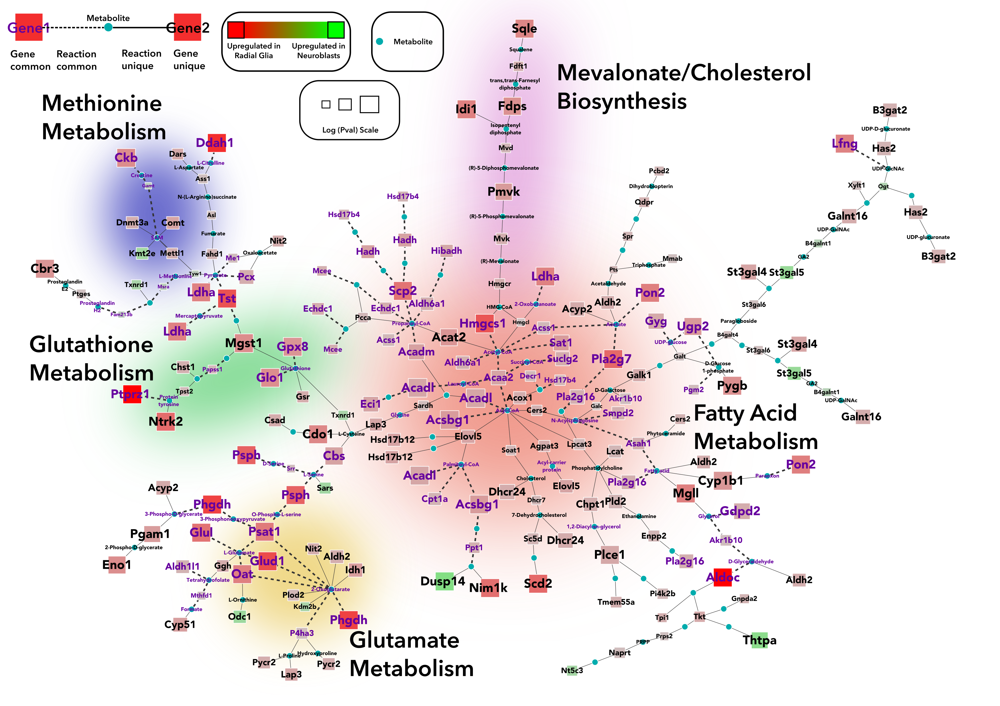

In [52]:
IRdisplay::display_png(file = "Dentate_RPs_vs_Neurons_intomix.png")